<a href="https://colab.research.google.com/github/kingluda/Geospatial-Analysis-and-Visualization/blob/main/Working_with_basemaps.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Overview

Creating geospatial visualizations often require overlaying your data on a basemap. [Contextily](https://contextily.readthedocs.io/en/latest/) is a package that allows you to fetch various basemaps from the internet and add them to your plot as static images.

We will learn how to take a shapefile showing the path of the [2017 Solar Eclipse](https://svs.gsfc.nasa.gov/4518) and create a map with a topographic basemap. NASA also provides similar data for other eclipses, including the [2024 Total Solar Eclipse](https://svs.gsfc.nasa.gov/5123/).

## Setup and Data Download

The following blocks of code will install the required packages and download the datasets to your Colab environment.

In [1]:
%%capture
if 'google.colab' in str(get_ipython()):
  !pip install contextily

In [2]:
import contextily as cx
import geopandas as gpd
import matplotlib.pyplot as plt
import os
import requests
import shapely

In [3]:
data_folder = 'data'
output_folder = 'output'

if not os.path.exists(data_folder):
    os.mkdir(data_folder)
if not os.path.exists(output_folder):
    os.mkdir(output_folder)

In [4]:
def download(url):
    filename = os.path.join(data_folder, os.path.basename(url))
    if not os.path.exists(filename):
      with requests.get(url, stream=True, allow_redirects=True) as r:
          with open(filename, 'wb') as f:
              for chunk in r.iter_content(chunk_size=8192):
                  f.write(chunk)
      print('Downloaded', filename)

In [5]:
path_shapefile = 'upath17'
umbra_shapefile = 'umbra17'
penumbra_shapefile = 'penum17'

shapefile_exts = ['.shp', '.shx', '.dbf', '.prj']
data_url = 'https://github.com/spatialthoughts/python-dataviz-web/releases/' \
  'download/eclipse/'

for shapefile in [path_shapefile, umbra_shapefile, penumbra_shapefile]:
  for ext in shapefile_exts:
    url = data_url + shapefile + ext
    download(url)

Downloaded data/upath17.shp
Downloaded data/upath17.shx
Downloaded data/upath17.dbf
Downloaded data/upath17.prj
Downloaded data/umbra17.shp
Downloaded data/umbra17.shx
Downloaded data/umbra17.dbf
Downloaded data/umbra17.prj
Downloaded data/penum17.shp
Downloaded data/penum17.shx
Downloaded data/penum17.dbf
Downloaded data/penum17.prj


## Data Pre-Processing

In [6]:
path_shapefile_path = os.path.join(
    data_folder, path_shapefile + '.shp')
path_gdf = gpd.read_file(path_shapefile_path)
path_gdf

,Name,Time0,Time1,geometry
0,UmbraPath,17:00,19:50,"POLYGON ((-130.08398 45.36563, -130.07227 45.3..."


In [7]:
umbra_shapefile_path = os.path.join(
    data_folder, umbra_shapefile + '.shp')
umbra_gdf = gpd.read_file(umbra_shapefile_path)
umbra_gdf[:5]

,Name,Time,TZ,geometry
0,Umbra01,10:00,PDT,"POLYGON ((-141.73242 44.78022, -141.7207 44.78..."
1,Umbra02,10:10,PDT,"POLYGON ((-130.59961 45.3565, -130.58789 45.35..."
2,Umbra03,10:20,PDT,"POLYGON ((-121.85742 45.20222, -121.8457 45.20..."
3,Umbra04,11:30,MDT,"POLYGON ((-114.7793 44.60543, -114.76758 44.60..."
4,Umbra05,11:40,MDT,"POLYGON ((-108.63867 43.72656, -108.62695 43.7..."


## Create a Multi-Layer Map

We can show a GeoDataFrame using the `plot()` method.

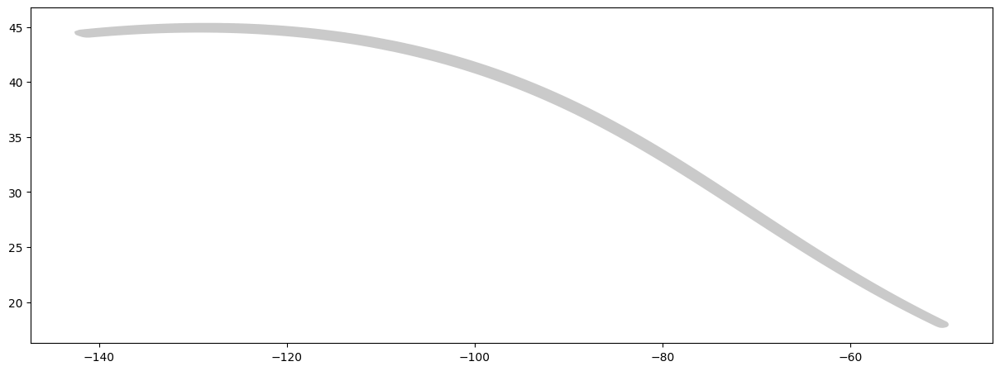

In [8]:
fig, ax = plt.subplots(1, 1)
fig.set_size_inches(15,7)
path_gdf.plot(
    ax=ax,
    facecolor='#969696',
    edgecolor='none',
    alpha=0.5)
plt.show()

To add another layer to our plot, we can simply render another GeoDataFrame on the same Axes.

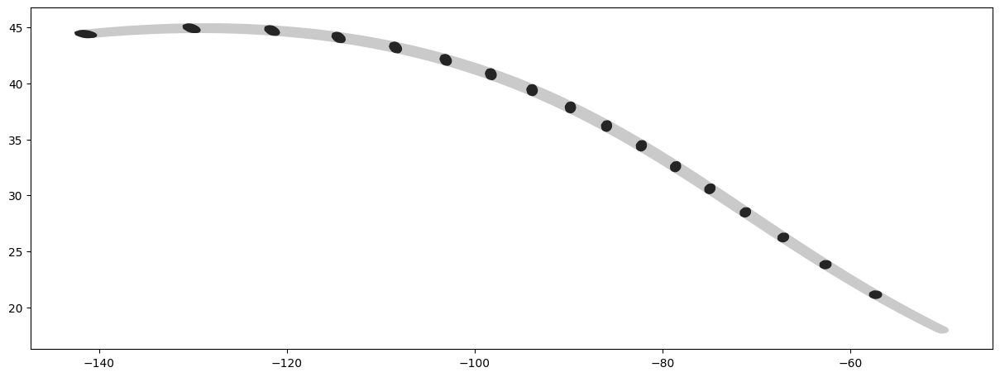

In [9]:
fig, ax = plt.subplots(1, 1)
fig.set_size_inches(15,7)
path_gdf.plot(
    ax=ax,
    facecolor='#969696',
    edgecolor='none',
    alpha=0.5)

umbra_gdf.plot(
    ax=ax,
    facecolor='#252525',
    edgecolor='none')

plt.show()

## Add A BaseMap

The visualization is not useful as it is missing context. We want to overlay this on a basemap to understand where the eclipse was visible from. We can choose from a variety of basemap tiles. There are over 200 basemap styles included in the library. Let's see them using the `providers` property.

In [10]:
providers = cx.providers
providers

{'OpenStreetMap': {'Mapnik': {'url': 'https://tile.openstreetmap.org/{z}/{x}/{y}.png',
   'max_zoom': 19,
   'html_attribution': '&copy; <a href="https://www.openstreetmap.org/copyright">OpenStreetMap</a> contributors',
   'attribution': '(C) OpenStreetMap contributors',
   'name': 'OpenStreetMap.Mapnik'},
  'DE': {'url': 'https://tile.openstreetmap.de/{z}/{x}/{y}.png',
   'max_zoom': 18,
   'html_attribution': '&copy; <a href="https://www.openstreetmap.org/copyright">OpenStreetMap</a> contributors',
   'attribution': '(C) OpenStreetMap contributors',
   'name': 'OpenStreetMap.DE'},
  'CH': {'url': 'https://tile.osm.ch/switzerland/{z}/{x}/{y}.png',
   'max_zoom': 18,
   'html_attribution': '&copy; <a href="https://www.openstreetmap.org/copyright">OpenStreetMap</a> contributors',
   'attribution': '(C) OpenStreetMap contributors',
   'bounds': [[45, 5], [48, 11]],
   'name': 'OpenStreetMap.CH'},
  'France': {'url': 'https://{s}.tile.openstreetmap.fr/osmfr/{z}/{x}/{y}.png',
   'max_zoom': 20,
   'html_attribution': '&copy; OpenStreetMap France | &copy; <a href="https://www.openstreetmap.org/copyright">OpenStreetMap</a> contributors',
   'attribution': '(C) OpenStreetMap France | (C) OpenStreetMap contributors',
   'name': 'OpenStreetMap.France'},
  'HOT': {'url': 'https://{s}.tile.openstreetmap.fr/hot/{z}/{x}/{y}.png',
   'max_zoom': 19,
   'html_attribution': '&copy; <a href="https://www.openstreetmap.org/copyright">OpenStreetMap</a> contributors, Tiles style by <a href="https://www.hotosm.org/" target="_blank">Humanitarian OpenStreetMap Team</a> hosted by <a href="https://openstreetmap.fr/" target="_blank">OpenStreetMap France</a>',
   'attribution': '(C) OpenStreetMap contributors, Tiles style by Humanitarian OpenStreetMap Team hosted by OpenStreetMap France',
   'name': 'OpenStreetMap.HOT'},
  'BZH': {'url': 'https://tile.openstreetmap.bzh/br/{z}/{x}/{y}.png',
   'max_zoom': 19,
   'html_attribution': '&copy; <a href="https://www.openstreetmap.org/copyright">OpenStreetMap</a> contributors, Tiles courtesy of <a href="http://www.openstreetmap.bzh/" target="_blank">Breton OpenStreetMap Team</a>',
   'attribution': '(C) OpenStreetMap contributors, Tiles courtesy of Breton OpenStreetMap Team',
   'bounds': [[46.2, -5.5], [50, 0.7]],
   'name': 'OpenStreetMap.BZH'},
  'CAT': {'url': 'https://tile.openstreetmap.bzh/ca/{z}/{x}/{y}.png',
   'max_zoom': 19,
   'html_attribution': '&copy; <a href="https://www.openstreetmap.org/copyright">OpenStreetMap</a> contributors, Tiles courtesy of <a href="https://www.openstreetmap.cat" target="_blank">Breton OpenStreetMap Team</a>',
   'attribution': '(C) OpenStreetMap contributors, Tiles courtesy of Breton OpenStreetMap Team',
   'name': 'OpenStreetMap.CAT'}},
 'MapTilesAPI': {'OSMEnglish': {'url': 'https://maptiles.p.rapidapi.com/{variant}/{z}/{x}/{y}.png?rapidapi-key={apikey}',
   'html_attribution': '&copy; <a href="http://www.maptilesapi.com/">MapTiles API</a>, &copy; <a href="https://www.openstreetmap.org/copyright">OpenStreetMap</a> contributors',
   'attribution': '(C) MapTiles API, (C) OpenStreetMap contributors',
   'variant': 'en/map/v1',
   'apikey': '<insert your api key here>',
   'max_zoom': 19,
   'name': 'MapTilesAPI.OSMEnglish'},
  'OSMFrancais': {'url': 'https://maptiles.p.rapidapi.com/{variant}/{z}/{x}/{y}.png?rapidapi-key={apikey}',
   'html_attribution': '&copy; <a href="http://www.maptilesapi.com/">MapTiles API</a>, &copy; <a href="https://www.openstreetmap.org/copyright">OpenStreetMap</a> contributors',
   'attribution': '(C) MapTiles API, (C) OpenStreetMap contributors',
   'variant': 'fr/map/v1',
   'apikey': '<insert your api key here>',
   'max_zoom': 19,
   'name': 'MapTilesAPI.OSMFrancais'},
  'OSMEspagnol': {'url': 'https://maptiles.p.rapidapi.com/{variant}/{z}/{x}/{y}.png?rapidapi-key={apikey}',
   'html_attribution': '&copy; <a href="http://www.maptilesapi.com/">MapTiles API</a>, &copy; <a href="https://www.openstreetmap.org/copyright">OpenStreetMap</a> contribut

Some of the providers are open-access while others require registration and obtaining an API key. We can filter the list to only open-access providers.

In [11]:
open_access_providers = providers.filter(requires_token=False)
open_access_providers

{'OpenStreetMap': {'Mapnik': {'url': 'https://tile.openstreetmap.org/{z}/{x}/{y}.png',
   'max_zoom': 19,
   'html_attribution': '&copy; <a href="https://www.openstreetmap.org/copyright">OpenStreetMap</a> contributors',
   'attribution': '(C) OpenStreetMap contributors',
   'name': 'OpenStreetMap.Mapnik'},
  'DE': {'url': 'https://tile.openstreetmap.de/{z}/{x}/{y}.png',
   'max_zoom': 18,
   'html_attribution': '&copy; <a href="https://www.openstreetmap.org/copyright">OpenStreetMap</a> contributors',
   'attribution': '(C) OpenStreetMap contributors',
   'name': 'OpenStreetMap.DE'},
  'CH': {'url': 'https://tile.osm.ch/switzerland/{z}/{x}/{y}.png',
   'max_zoom': 18,
   'html_attribution': '&copy; <a href="https://www.openstreetmap.org/copyright">OpenStreetMap</a> contributors',
   'attribution': '(C) OpenStreetMap contributors',
   'bounds': [[45, 5], [48, 11]],
   'name': 'OpenStreetMap.CH'},
  'France': {'url': 'https://{s}.tile.openstreetmap.fr/osmfr/{z}/{x}/{y}.png',
   'max_zoom': 20,
   'html_attribution': '&copy; OpenStreetMap France | &copy; <a href="https://www.openstreetmap.org/copyright">OpenStreetMap</a> contributors',
   'attribution': '(C) OpenStreetMap France | (C) OpenStreetMap contributors',
   'name': 'OpenStreetMap.France'},
  'HOT': {'url': 'https://{s}.tile.openstreetmap.fr/hot/{z}/{x}/{y}.png',
   'max_zoom': 19,
   'html_attribution': '&copy; <a href="https://www.openstreetmap.org/copyright">OpenStreetMap</a> contributors, Tiles style by <a href="https://www.hotosm.org/" target="_blank">Humanitarian OpenStreetMap Team</a> hosted by <a href="https://openstreetmap.fr/" target="_blank">OpenStreetMap France</a>',
   'attribution': '(C) OpenStreetMap contributors, Tiles style by Humanitarian OpenStreetMap Team hosted by OpenStreetMap France',
   'name': 'OpenStreetMap.HOT'},
  'BZH': {'url': 'https://tile.openstreetmap.bzh/br/{z}/{x}/{y}.png',
   'max_zoom': 19,
   'html_attribution': '&copy; <a href="https://www.openstreetmap.org/copyright">OpenStreetMap</a> contributors, Tiles courtesy of <a href="http://www.openstreetmap.bzh/" target="_blank">Breton OpenStreetMap Team</a>',
   'attribution': '(C) OpenStreetMap contributors, Tiles courtesy of Breton OpenStreetMap Team',
   'bounds': [[46.2, -5.5], [50, 0.7]],
   'name': 'OpenStreetMap.BZH'},
  'CAT': {'url': 'https://tile.openstreetmap.bzh/ca/{z}/{x}/{y}.png',
   'max_zoom': 19,
   'html_attribution': '&copy; <a href="https://www.openstreetmap.org/copyright">OpenStreetMap</a> contributors, Tiles courtesy of <a href="https://www.openstreetmap.cat" target="_blank">Breton OpenStreetMap Team</a>',
   'attribution': '(C) OpenStreetMap contributors, Tiles courtesy of Breton OpenStreetMap Team',
   'name': 'OpenStreetMap.CAT'}},
 'OpenSeaMap': {'url': 'https://tiles.openseamap.org/seamark/{z}/{x}/{y}.png',
  'html_attribution': 'Map data: &copy; <a href="http://www.openseamap.org">OpenSeaMap</a> contributors',
  'attribution': 'Map data: (C) OpenSeaMap contributors',
  'name': 'OpenSeaMap'},
 'OPNVKarte': {'url': 'https://tileserver.memomaps.de/tilegen/{z}/{x}/{y}.png',
  'max_zoom': 18,
  'html_attribution': 'Map <a href="https://memomaps.de/">memomaps.de</a> <a href="http://creativecommons.org/licenses/by-sa/2.0/">CC-BY-SA</a>, map data &copy; <a href="https://www.openstreetmap.org/copyright">OpenStreetMap</a> contributors',
  'attribution': 'Map memomaps.de CC-BY-SA, map data (C) OpenStreetMap contributors',
  'name': 'OPNVKarte'},
 'OpenTopoMap': {'url': 'https://{s}.tile.opentopomap.org/{z}/{x}/{y}.png',
  'max_zoom': 17,
  'html_attribution': 'Map data: &copy; <a href="https://www.openstreetmap.org/copyright">OpenStreetMap</a> contributors, <a href="http://viewfinderpanoramas.org">SRTM</a> | Map style: &copy; <a href="https://opentopomap.org">OpenTopoMap</a> (<a href="https://creativecommons.org/licenses/by-sa/3.0/">CC-BY-SA</a>)',
  'attribution': 'Map data: (C) OpenStreetMap contributors, SRTM | Map style: (C) OpenTopoMap (CC-BY-SA)',
  'name': 'OpenTopoM

For overlaying the eclipse path, let's use the *OpenTopoMap* basemap. We need to specify a CRS for the map. For now, let's use the CRS of the original shapefile.

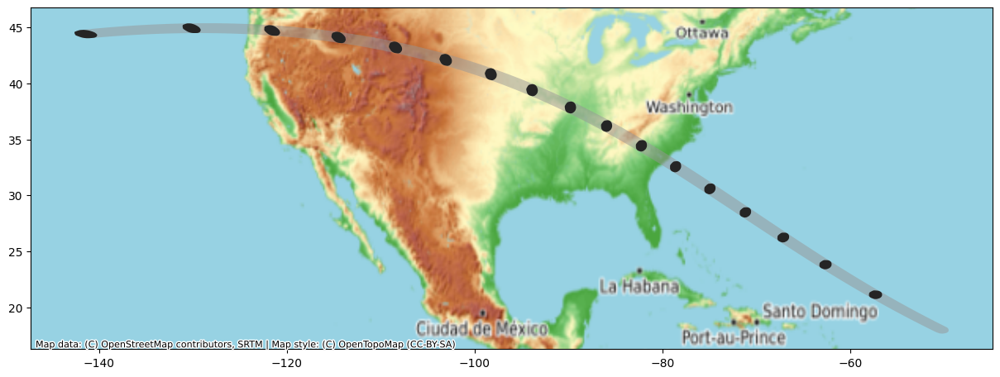

In [12]:
fig, ax = plt.subplots(1, 1)
fig.set_size_inches(15,7)

path_gdf.plot(
    ax=ax,
    facecolor='#969696',
    edgecolor='none',
    alpha=0.5)

umbra_gdf.plot(
    ax=ax,
    facecolor='#252525',
    edgecolor='none')

cx.add_basemap(
    ax,
    crs=path_gdf.crs,
    source=cx.providers.OpenTopoMap)

plt.show()

We can request higher resolution tiles by specifying the `zoom` parameter. But increasing zoom level means many more tiles need to be downloaded. Contextily has some utility functions to find out the zoom level and corresponding tiles that needs to be downloaded.

In [13]:
zoom_level = cx.tile._calculate_zoom(*path_gdf.total_bounds)
zoom_level

3

In [14]:
cx.howmany(*path_gdf.total_bounds, 4, ll=True)


Using zoom level 4, this will download 15 tiles


15

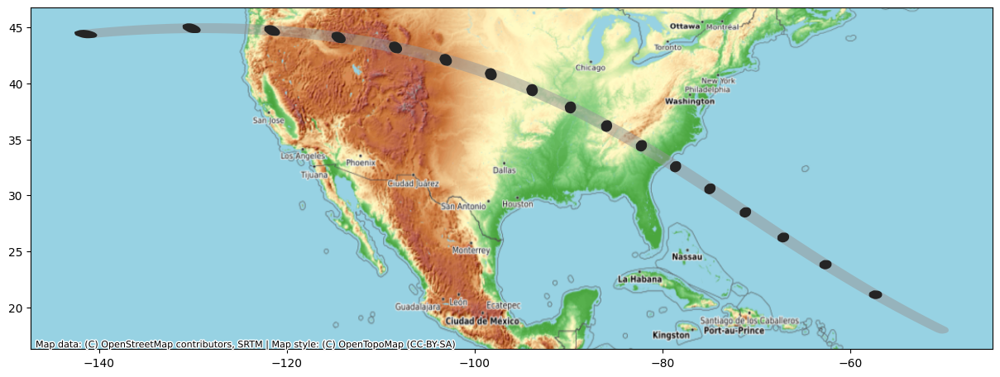

In [15]:
fig, ax = plt.subplots(1, 1)
fig.set_size_inches(15,7)

path_gdf.plot(
    ax=ax,
    facecolor='#969696',
    edgecolor='none',
    alpha=0.5)

umbra_gdf.plot(
    ax=ax,
    facecolor='#252525',
    edgecolor='none')

cx.add_basemap(
    ax,
    crs=path_gdf.crs,
    source=cx.providers.OpenTopoMap,
    zoom=4)

plt.show()

As this eclipse primarily covers the United States, we can create a visualization in a CRS suited for the region. We reproject the layers to the US National Atlas Equal Area projection and set the map extent to the bounds of the continental united states.

In [17]:
crs = 'EPSG:9311'

path_reprojected = path_gdf.to_crs(crs)
umbra_reprojected = umbra_gdf.to_crs(crs)

# Use the bounding box coordinates for continental us
usa = shapely.geometry.box(-125, 24, -66, 49)
usa_gdf = gpd.GeoDataFrame(geometry=[usa], crs='EPSG:4326')
usa_gdf_reprojected = usa_gdf.to_crs(crs)
bounds = usa_gdf_reprojected.total_bounds

bounds

array([-2541705.69236695, -1960818.71207086,  3408818.26526139,
         969702.54831045])

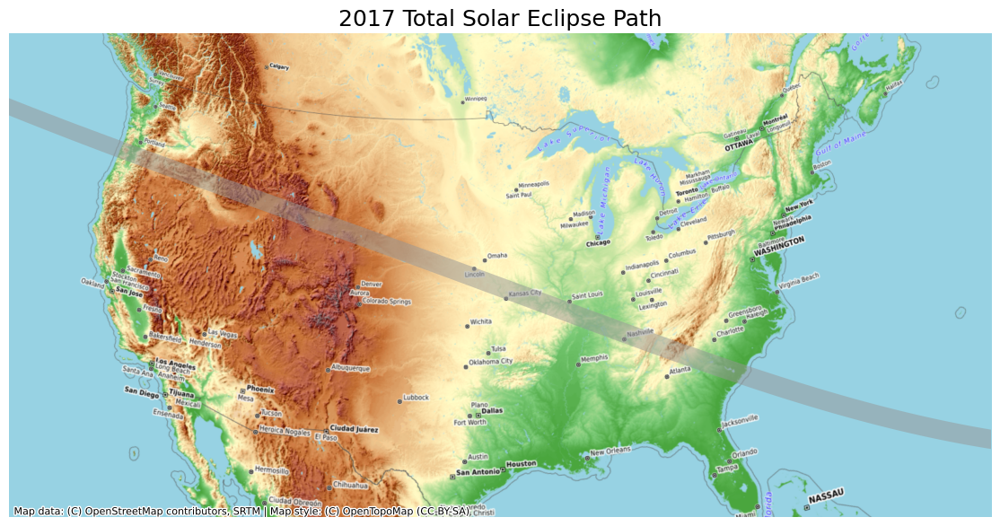

In [23]:
fig, ax = plt.subplots(1, 1)
fig.set_size_inches(15,7)

# Set the bounds
ax.set_xlim(bounds[0], bounds[2])
ax.set_ylim(bounds[1], bounds[3])

path_reprojected.plot(
    ax=ax,
    facecolor='#969696',
    edgecolor='none',
    alpha=0.5)

umbra_reprojected.plot(
    ax=ax,
    facecolor='#252525',
    edgecolor='none')

cx.add_basemap(
    ax,
    crs=path_reprojected.crs,
    source=cx.providers.OpenTopoMap,
    zoom=5)

ax.set_axis_off()
ax.set_title('2017 Total Solar Eclipse Path', size = 18)

plt.show()

## Exercise

1. Our eclipse dataset also contains polygons for penumbra contours. Add them to the visualization. This layer has a column `Obscur` that contains the obscuration value (the fraction of the Sun's area covered by the Moon). Style the contours by the obscuration value and add it to the map.
2. Instead of the OpenTopoMap, create a visualization using another basemap. Some options to try are  `Esri.WorldTerrain`, `CartoDB.Positron` and `USGS.USTopo`.

<img src='https://courses.spatialthoughts.com/images/python_dataviz/eclipse_path.png' width=800/>

The code below reads and re-projects the penumbra shapefile.

In [19]:
penumbra_shapefile_path = os.path.join(
    data_folder, penumbra_shapefile + '.shp')
penumbra_gdf = gpd.read_file(penumbra_shapefile_path)
penumbra_reprojected = penumbra_gdf.to_crs(crs)
penumbra_reprojected

,Name,Obscur,geometry
0,Penumbra90,0.8999,"POLYGON ((-2173771.327 785874.329, -2170802.55..."
1,Penumbra75,0.7500,"POLYGON ((-2115210.658 1280706.27, -2112516.39..."
2,Penumbra50,0.5000,"POLYGON ((-5038961.859 2917526.896, -5035860.5..."
3,Penumbra25,0.2500,"POLYGON ((-5611804.242 2496237.684, -5610733.8..."
4,Penumbra00,0.0000,"POLYGON ((-6429500.671 1778744.247, -6429115.4..."


You can use the code block below for creating the visualization. It render the Penumbra polygons by the `Obsur` column using a transparency value of `0.2` (20%). Complete the exercise by rendering the Path and Umbra layers on top and add a basemap of your choice.

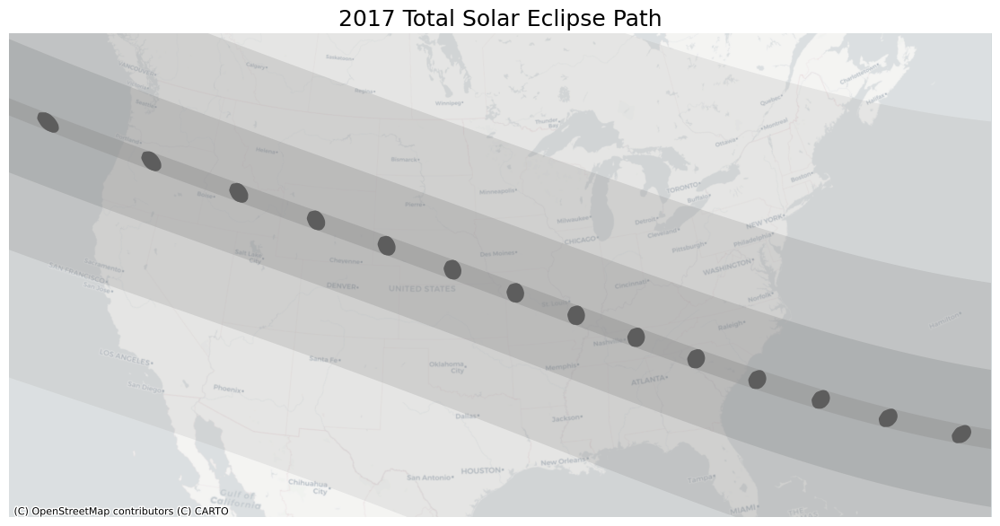

In [29]:
fig, ax = plt.subplots(1, 1)
fig.set_size_inches(15,7)

# Set the bounds
ax.set_xlim(bounds[0], bounds[2])
ax.set_ylim(bounds[1], bounds[3])

penumbra_reprojected.plot(
    ax=ax,
    column='Obscur',
    cmap='Greys',
    linewidth=1,
    alpha=0.2,

)

umbra_reprojected.plot(
    ax=ax,
    facecolor='#252525',
    edgecolor='none')

path_reprojected.plot(
    ax=ax,
    facecolor='#969696',
    edgecolor='none',
    alpha=0.5)

cx.add_basemap(
    ax,
    crs=path_reprojected.crs,
    source=cx.providers.CartoDB.Positron,
    zoom=5)

ax.set_axis_off()
ax.set_title('2017 Total Solar Eclipse Path', size = 18)

plt.show()

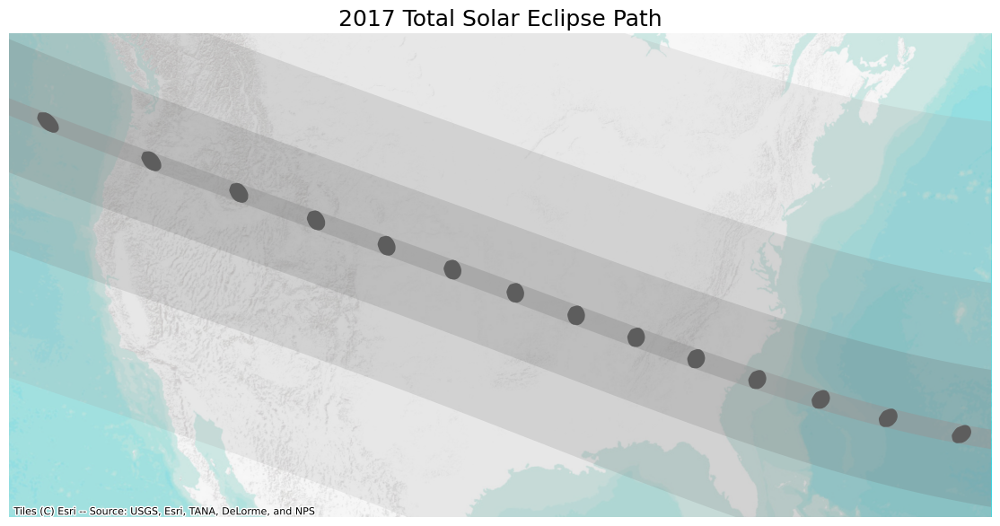

In [30]:
fig, ax = plt.subplots(1, 1)
fig.set_size_inches(15,7)

# Set the bounds
ax.set_xlim(bounds[0], bounds[2])
ax.set_ylim(bounds[1], bounds[3])

penumbra_reprojected.plot(
    ax=ax,
    column='Obscur',
    cmap='Greys',
    linewidth=1,
    alpha=0.2,

)

umbra_reprojected.plot(
    ax=ax,
    facecolor='#252525',
    edgecolor='none')

path_reprojected.plot(
    ax=ax,
    facecolor='#969696',
    edgecolor='none',
    alpha=0.5)

cx.add_basemap(
    ax,
    crs=path_reprojected.crs,
    source=cx.providers.Esri.WorldTerrain,
    zoom=5)

ax.set_axis_off()
ax.set_title('2017 Total Solar Eclipse Path', size = 18)

plt.show()

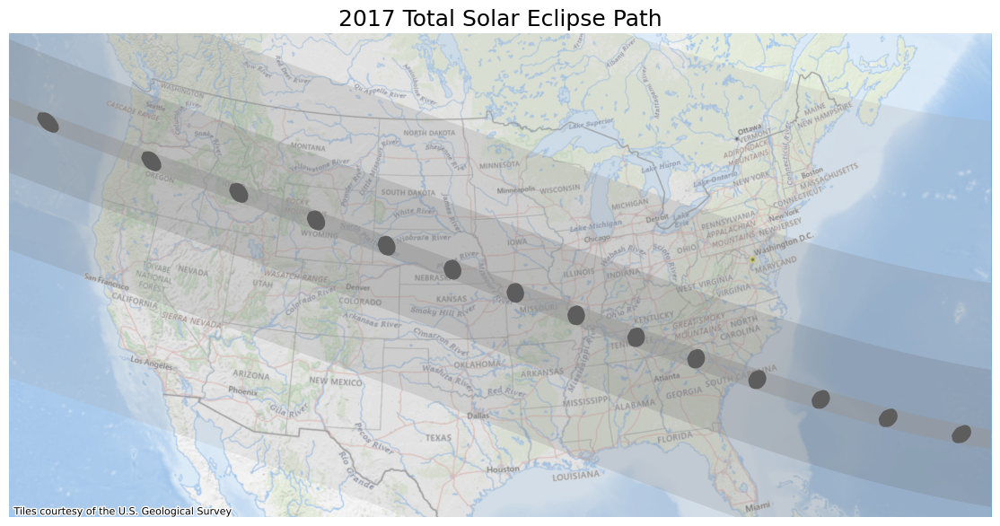

In [31]:
fig, ax = plt.subplots(1, 1)
fig.set_size_inches(15,7)

# Set the bounds
ax.set_xlim(bounds[0], bounds[2])
ax.set_ylim(bounds[1], bounds[3])

penumbra_reprojected.plot(
    ax=ax,
    column='Obscur',
    cmap='Greys',
    linewidth=1,
    alpha=0.2,

)

umbra_reprojected.plot(
    ax=ax,
    facecolor='#252525',
    edgecolor='none')

path_reprojected.plot(
    ax=ax,
    facecolor='#969696',
    edgecolor='none',
    alpha=0.5)

cx.add_basemap(
    ax,
    crs=path_reprojected.crs,
    source=cx.providers.USGS.USTopo,
    zoom=5)

ax.set_axis_off()
ax.set_title('2017 Total Solar Eclipse Path', size = 18)

plt.show()